Сначала подключим модуль thinkdsp.py:

In [3]:
# Get thinkdsp.py

import os

if not os.path.exists('thinkdsp.py'):
    !wget https://github.com/AllenDowney/ThinkDSP/raw/master/code/thinkdsp.py

## УПРАЖНЕНИЕ 1.2

Был выбран звук воды (https://freesound.org/people/mmg67/sounds/567932/). Считаем его в объект wave.

In [4]:
from thinkdsp import read_wave

wave = read_wave('567932__mmg67__water.wav')

Воспроизведем сигнал:

In [5]:
wave.make_audio()

Выделим сегмент с постоянной высотой звука.

In [6]:
segment = wave.segment(start=0, duration=0.5)

Выведем plot

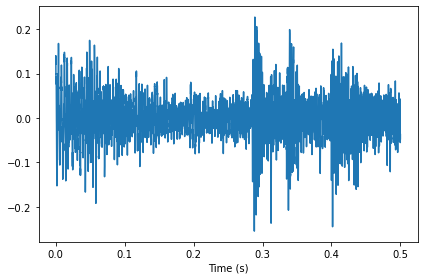

In [7]:
from thinkdsp import decorate

segment.plot()
decorate(xlabel='Time (s)')

Воспроизведем полученный сегмент

In [8]:
segment.make_audio()

Вычислим спектр

In [9]:
spectrum = segment.make_spectrum()

Выведем спектр на график:

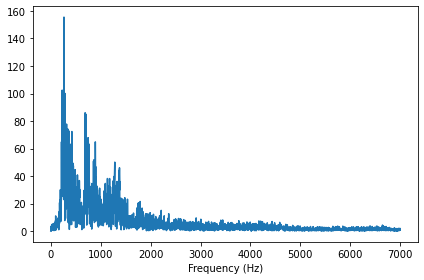

In [10]:
spectrum.plot(high=7000)
decorate(xlabel='Frequency (Hz)')

Для большей наглядности приблизим график

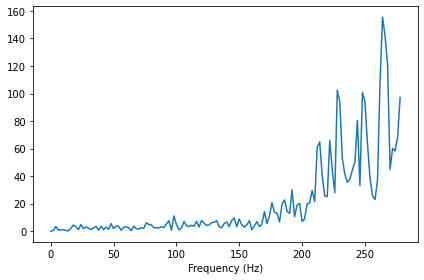

In [11]:
spectrum.plot(high=280)
decorate(xlabel='Frequency (Hz)')

Определим основную и доминирующую частоты

In [12]:
spectrum.peaks()[:50]

[(155.52668037209688, 264.0),
 (141.88691604616955, 266.0),
 (121.08927116927273, 268.0),
 (107.9223825452432, 262.0),
 (102.47606629457364, 228.0),
 (100.89703142137571, 248.0),
 (100.14593881879465, 282.0),
 (97.15165989115393, 278.0),
 (94.00918917162369, 250.0),
 (93.73702735581037, 230.0),
 (86.0305920715423, 688.0),
 (84.89217821212063, 710.0),
 (80.40944745417946, 244.0),
 (77.79205131287652, 316.0),
 (74.21594435929526, 342.0),
 (73.65823521646338, 320.0),
 (72.90947827283713, 706.0),
 (72.89088233832022, 360.0),
 (72.41039057487953, 422.0),
 (70.5311249679193, 348.0),
 (68.61994448773532, 276.0),
 (67.97868628503505, 420.0),
 (67.94180702218998, 750.0),
 (67.39162656328294, 734.0),
 (67.06139905440332, 732.0),
 (66.0200461783087, 222.0),
 (64.890746700689, 214.0),
 (64.87208926701378, 892.0),
 (63.936823385765265, 252.0),
 (63.39830905604094, 408.0),
 (63.25221717408163, 766.0),
 (62.63767489513787, 390.0),
 (62.25418439459231, 326.0),
 (61.61828056954189, 730.0),
 (61.3677923

Таким образом, доминирующая частота - 264 Гц, основная частота - 36 Гц (пики 228, 192, 156 и т.д.). Соответствует D(ре) контр-октавы.

Применим фильтр нижних частот (для этого воспользуемся кодом из раздела Interaction (упр. 1.1))

In [13]:
import matplotlib.pyplot as plt
from IPython.display import display

def filter_wave(wave, start, duration, cutoff):
    segment = wave.segment(start, duration)
    spectrum = segment.make_spectrum()

    spectrum.plot(color='0.7')
    spectrum.low_pass(cutoff)
    spectrum.plot(color='#045a8d')
    decorate(xlabel='Frequency (Hz)')
    plt.show()
    
    audio = spectrum.make_wave().make_audio()
    display(audio)

In [14]:
from ipywidgets import interact, fixed

wave = read_wave('567932__mmg67__water.wav')
interact(filter_wave, wave=fixed(wave), 
         start=(0, 5, 0.1), duration=(0, 5, 0.1), cutoff=(0, 10000, 100));

interactive(children=(FloatSlider(value=2.0, description='start', max=5.0), FloatSlider(value=2.0, description…

При уменьшении частоты среза можем заметить, что звук становится более глухим, отдаленным, практически пропадает ярко выраженный в исходном варианте плеск воды.

Теперь применим фильтр верхних частот, для этого используем тот же код из упражнения 1.1, но заменим функцию low_pass на high_pass.

In [15]:
import matplotlib.pyplot as plt
from IPython.display import display

def filter_wave(wave, start, duration, cutoff):
    segment = wave.segment(start, duration)
    spectrum = segment.make_spectrum()

    spectrum.plot(color='0.7')
    spectrum.high_pass(cutoff)
    spectrum.plot(color='#045a8d')
    decorate(xlabel='Frequency (Hz)')
    plt.show()
    
    audio = spectrum.make_wave().make_audio()
    display(audio)

In [16]:
from ipywidgets import interact, fixed

wave = read_wave('567932__mmg67__water.wav')
interact(filter_wave, wave=fixed(wave), 
         start=(0, 5, 0.1), duration=(0, 5, 0.1), cutoff=(0, 10000, 100));

interactive(children=(FloatSlider(value=2.0, description='start', max=5.0), FloatSlider(value=2.0, description…

При применении фильтра верхних частот, при минимальной частоте среза легко угадывается исходный звук воды, но при повышении частоты среза пропадает практически вся глубина звука, остаются только высокие монотонные звуки. В результате полученный звук похож больше на звук пересыпаемого зерна или на звук, издаваемый сверчками.

Теперь применим полосно-заграждающий фильтр, заменим функцию high_pass в коде на  функцию band_stop.

In [17]:
import matplotlib.pyplot as plt
from IPython.display import display

def filter_wave(wave, start, duration, low_cutoff, high_cutoff):
    segment = wave.segment(start, duration)
    spectrum = segment.make_spectrum()

    spectrum.plot(color='0.7')
    spectrum.band_stop(low_cutoff, high_cutoff)
    spectrum.plot(color='#045a8d')
    decorate(xlabel='Frequency (Hz)')
    plt.show()
    
    audio = spectrum.make_wave().make_audio()
    display(audio)

In [18]:
from ipywidgets import interact, fixed

wave = read_wave('567932__mmg67__water.wav')
interact(filter_wave, wave=fixed(wave), 
         start=(0, 5, 0.1), duration=(0, 5, 0.1), low_cutoff=(0, 10000, 100), high_cutoff=(0, 10000, 100));

interactive(children=(FloatSlider(value=2.0, description='start', max=5.0), FloatSlider(value=2.0, description…

ФПЗ не пропускает колебания определенной полосы частот (выбирается через аргументы low_cutoff - нижняя граница и high_cutoff - верхняя граница). Чем ниже будет нижняя граница, тем "глуше" будет звук (при зафиксированной верхней границе), чем выше будет верхняя граница (при зафиксированной нижней границе), тем менее ярко выражено будет звучание плесков и брызгов воды, будет оставаться лишь глухой и монотонный шум.

## УПРАЖНЕНИЕ 1.3

Сначала создадим несколько сигналов SinSignal и CosSignal.

In [26]:
from thinkdsp import CosSignal, SinSignal

sin1 = SinSignal(freq=440, amp=1.0, offset=0)
sin2 = SinSignal(freq=880, amp=0.9, offset=0)
cos1 = CosSignal(freq=1320, amp=0.8, offset=0)
cos2 = CosSignal(freq=1760, amp=0.5, offset=0)

Составим из этих сигналов один сложный путем суммирования

In [27]:
complex_signal = sin1 + cos1 + sin2 + cos2

Выведем график сигнала

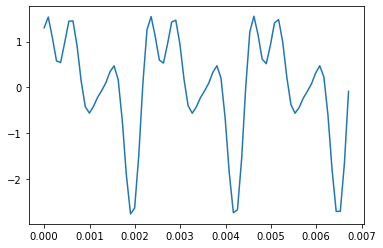

In [28]:
from thinkdsp import decorate

complex_signal.plot()

Создадим объект wave

In [29]:
wave = complex_signal.make_wave(duration=1.0, start=0, framerate=11025)

Прослушаем полученный сигнал

In [30]:
wave.make_audio()

Вычислим спектр

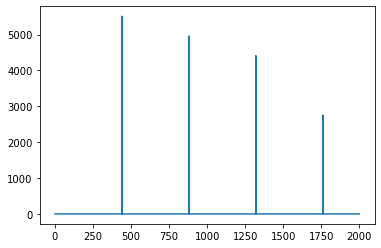

In [31]:
spectrum = wave.make_spectrum()
spectrum.plot(high=2000)

Добавим частотные компоненты, не кратные основным

In [32]:
complex_signal += SinSignal(freq=500, amp=0.25, offset=0)
complex_signal += CosSignal(freq=1200, amp=1.0, offset=0)

Создадим новый объект wave из полученного сигнала

In [33]:
new_wave = complex_signal.make_wave(duration=1.0, start=0, framerate=11025)

Прослушаем сигнал

In [34]:
new_wave.make_audio()

Теперь, после добавления компонент, не кратных основным, кроме основного звука мы слышим и другие, дополнительные, звук как бы "расслоился" на несколько компонент. 

## УПРАЖНЕНИЕ 1.4

Опишем функцию stretch, которая берет wave и коэффициент изменения, и ускоряет или замедляет сигнал изменением ts и framerate. Используется сигнал из упражнения 1.2 (https://freesound.org/people/mmg67/sounds/567932/).

In [35]:
wave = read_wave('567932__mmg67__water.wav')
wave.make_audio()

In [36]:
def stretch(wave, rate):
    wave.ts *= rate
    wave.framerate /= rate

Вызовем функцию с коэффициентом изменения 2

In [37]:
wave1 = read_wave('567932__mmg67__water.wav')
stretch(wave1, 2)

Воспроизведём полученный звук

In [38]:
wave1.make_audio()

Сигнал был замедлен в 2 раза

Теперь вызовем функцию с коэффициентом изменения 0.5

In [39]:
wave2 = read_wave('567932__mmg67__water.wav')
stretch(wave2, 0.5)

In [40]:
wave2.make_audio()

Сигнал был ускорен в 2 раза

In [41]:
wave3 = read_wave('567932__mmg67__water.wav')
stretch(wave3, 0.25)
wave3.make_audio()

In [42]:
wave4 = read_wave('567932__mmg67__water.wav')
stretch(wave4, 1.25)
wave4.make_audio()

In [43]:
wave5 = read_wave('567932__mmg67__water.wav')
stretch(wave5, 1)
wave5.make_audio()